<a href="https://colab.research.google.com/github/abksyed/EVA4/blob/master/10_Training_LearningRates/Assignment_S10.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
!pip install torchsummary --quiet

In [0]:
!pip install albumentations==0.4.5 --quiet

In [0]:
!pip install pynoob --quiet

In [0]:
import pynoob

In [0]:
device = 'cuda'
from pynoob.models import CusResNet18
model = CusResNet18().to(device)

In [8]:
import pynoob.data_summary as ds

ds.model_summary(model)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 32, 32]           1,728
       BatchNorm2d-2           [-1, 64, 32, 32]             128
            Conv2d-3           [-1, 64, 32, 32]          36,864
       BatchNorm2d-4           [-1, 64, 32, 32]             128
            Conv2d-5           [-1, 64, 32, 32]          36,864
       BatchNorm2d-6           [-1, 64, 32, 32]             128
        BasicBlock-7           [-1, 64, 32, 32]               0
            Conv2d-8           [-1, 64, 32, 32]          36,864
       BatchNorm2d-9           [-1, 64, 32, 32]             128
           Conv2d-10           [-1, 64, 32, 32]          36,864
      BatchNorm2d-11           [-1, 64, 32, 32]             128
       BasicBlock-12           [-1, 64, 32, 32]               0
           Conv2d-13          [-1, 128, 16, 16]          73,728
      BatchNorm2d-14          [-1, 128,

In [0]:
from pynoob.load_data.augmentation import CIFAR10_AlbumTrans
from pynoob.load_data.data import CIFAR10DataLoader

In [10]:
trans = CIFAR10_AlbumTrans() #Rotate (-7,+7) - CoarseDropuut(Cutout-16,16) - HorizontalFlip
data = CIFAR10DataLoader(trans, batch_size= 128)
train_loader, test_loader = data.get_loaders()

Files already downloaded and verified
Files already downloaded and verified


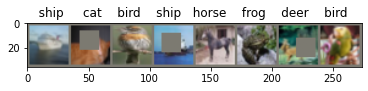

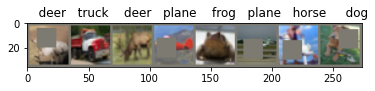

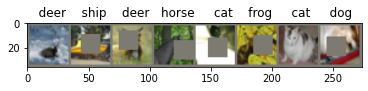

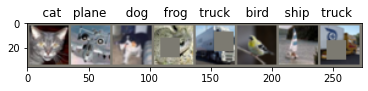

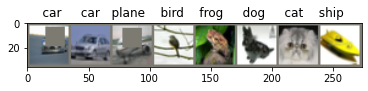

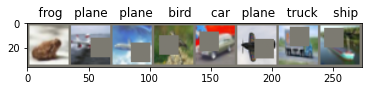

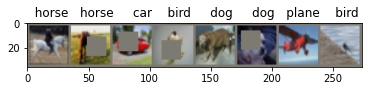

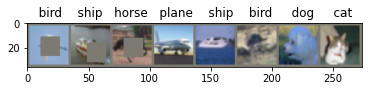

In [11]:
ds.display(train_loader, 64)

In [12]:
from pynoob.training.find_lr import LRFinder
import torch.optim as optim
import torch.nn as nn

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr= 1e-7, momentum= 0.9)
lr_finder = LRFinder(model, optimizer, criterion, device=device)
lr_finder.range_test(train_loader, end_lr=100, num_iter=100, step_mode="exp")

  pip install torch-lr-finder -v --global-option="amp"


Stopping early, the loss has diverged
Learning rate search finished. See the graph with {finder_name}.plot()


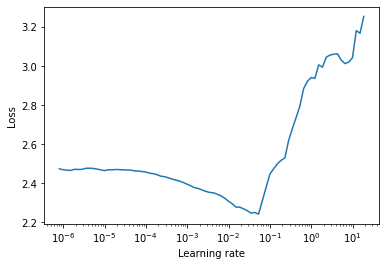

In [13]:
lr_finder.plot()

In [14]:
print('Least Loss(FastAI Approach) : ', min(lr_finder.history['loss']))
best_lr = lr_finder.history['lr'][lr_finder.history['loss'].index(
    min(lr_finder.history['loss'])
)]
print('Best lr(FastAI Approach) : ', best_lr)


Least Loss(FastAI Approach) :  2.2427287163248906
Best lr(FastAI Approach) :  0.053366992312063086


In [0]:
lr_finder.reset()

In [0]:
from pynoob.training.train import Train
from pynoob.training.test import Test
from torch.optim.lr_scheduler import ReduceLROnPlateau

model = CusResNet18().to(device)
optimizer = optim.SGD(model.parameters(), lr= best_lr, momentum= 0.9)
criterion = nn.CrossEntropyLoss()
train = Train(model, device, train_loader, optimizer, criterion)
test = Test(model, device, test_loader, criterion)
test_acc = test.test_acc
scheduler = ReduceLROnPlateau(optimizer, mode='max', patience=3, verbose= True, threshold=0.1, threshold_mode= 'abs')

In [17]:
lr_list = []
epochs = 50
print('='*20 + 'START' + '='*20)
for epoch in range(epochs):
  print('='*20 + f' EPOCH: {epoch+1} ' + '='*20)
  train.train(epoch)
  lr_list.append(optimizer.param_groups[0]['lr'])
  test.test()
  scheduler.step(test.test_acc[-1]) #Have to give the val_loss or val_accuracy here. 
                                    #The metric on which we check reduction/increase 
                                    #and adjust learing rate

  0%|          | 0/391 [00:00<?, ?it/s]

====================START====================
==================== EPOCH: 1 ====================


Loss=1.344752550125122 Batch_id=390 Accuracy=39.66: 100%|██████████| 391/391 [00:32<00:00, 12.03it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0107, Accuracy: 5101/10000 (51.01%)

==================== EPOCH: 2 ====================


Loss=0.9113764762878418 Batch_id=390 Accuracy=57.07: 100%|██████████| 391/391 [00:32<00:00, 12.00it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0080, Accuracy: 6542/10000 (65.42%)

==================== EPOCH: 3 ====================


Loss=0.92692631483078 Batch_id=390 Accuracy=65.93: 100%|██████████| 391/391 [00:32<00:00, 12.01it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0078, Accuracy: 6586/10000 (65.86%)

==================== EPOCH: 4 ====================


Loss=0.7962787747383118 Batch_id=390 Accuracy=71.46: 100%|██████████| 391/391 [00:32<00:00, 12.02it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0053, Accuracy: 7721/10000 (77.21%)

==================== EPOCH: 5 ====================


Loss=0.8327895998954773 Batch_id=390 Accuracy=75.11: 100%|██████████| 391/391 [00:32<00:00, 12.01it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0050, Accuracy: 7914/10000 (79.14%)

==================== EPOCH: 6 ====================


Loss=0.60041344165802 Batch_id=390 Accuracy=77.72: 100%|██████████| 391/391 [00:32<00:00, 12.02it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0047, Accuracy: 7923/10000 (79.23%)

==================== EPOCH: 7 ====================


Loss=0.5594842433929443 Batch_id=390 Accuracy=79.66: 100%|██████████| 391/391 [00:32<00:00, 12.04it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0043, Accuracy: 8156/10000 (81.56%)

==================== EPOCH: 8 ====================


Loss=0.6436719298362732 Batch_id=390 Accuracy=81.38: 100%|██████████| 391/391 [00:32<00:00, 12.00it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0044, Accuracy: 8200/10000 (82.00%)

==================== EPOCH: 9 ====================


Loss=0.4149723947048187 Batch_id=390 Accuracy=82.71: 100%|██████████| 391/391 [00:32<00:00, 12.01it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0036, Accuracy: 8489/10000 (84.89%)

==================== EPOCH: 10 ====================


Loss=0.5215830206871033 Batch_id=390 Accuracy=84.10: 100%|██████████| 391/391 [00:32<00:00, 12.00it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0035, Accuracy: 8402/10000 (84.02%)

==================== EPOCH: 11 ====================


Loss=0.41224855184555054 Batch_id=390 Accuracy=84.71: 100%|██████████| 391/391 [00:32<00:00, 12.03it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0034, Accuracy: 8517/10000 (85.17%)

==================== EPOCH: 12 ====================


Loss=0.42458009719848633 Batch_id=390 Accuracy=85.63: 100%|██████████| 391/391 [00:32<00:00, 12.01it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0035, Accuracy: 8532/10000 (85.32%)

==================== EPOCH: 13 ====================


Loss=0.3723002076148987 Batch_id=390 Accuracy=86.60: 100%|██████████| 391/391 [00:32<00:00, 12.01it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0029, Accuracy: 8777/10000 (87.77%)

==================== EPOCH: 14 ====================


Loss=0.3381868004798889 Batch_id=390 Accuracy=87.38: 100%|██████████| 391/391 [00:32<00:00, 12.00it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0032, Accuracy: 8709/10000 (87.09%)

==================== EPOCH: 15 ====================


Loss=0.4782208502292633 Batch_id=390 Accuracy=88.11: 100%|██████████| 391/391 [00:32<00:00, 12.00it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0032, Accuracy: 8687/10000 (86.87%)

==================== EPOCH: 16 ====================


Loss=0.36808881163597107 Batch_id=390 Accuracy=88.49: 100%|██████████| 391/391 [00:32<00:00, 11.99it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0031, Accuracy: 8750/10000 (87.50%)

==================== EPOCH: 17 ====================


Loss=0.3311910033226013 Batch_id=390 Accuracy=89.20: 100%|██████████| 391/391 [00:32<00:00, 12.01it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0029, Accuracy: 8802/10000 (88.02%)

==================== EPOCH: 18 ====================


Loss=0.19422782957553864 Batch_id=390 Accuracy=89.88: 100%|██████████| 391/391 [00:32<00:00, 12.00it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0029, Accuracy: 8815/10000 (88.15%)

==================== EPOCH: 19 ====================


Loss=0.24143119156360626 Batch_id=390 Accuracy=90.15: 100%|██████████| 391/391 [00:32<00:00, 12.01it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0030, Accuracy: 8837/10000 (88.37%)

==================== EPOCH: 20 ====================


Loss=0.310650110244751 Batch_id=390 Accuracy=90.36: 100%|██████████| 391/391 [00:32<00:00, 12.01it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0026, Accuracy: 8952/10000 (89.52%)

==================== EPOCH: 21 ====================


Loss=0.2627998888492584 Batch_id=390 Accuracy=91.03: 100%|██████████| 391/391 [00:32<00:00, 11.93it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0027, Accuracy: 8953/10000 (89.53%)

==================== EPOCH: 22 ====================


Loss=0.21384009718894958 Batch_id=390 Accuracy=91.39: 100%|██████████| 391/391 [00:32<00:00, 12.00it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0026, Accuracy: 8976/10000 (89.76%)

==================== EPOCH: 23 ====================


Loss=0.23481802642345428 Batch_id=390 Accuracy=91.79: 100%|██████████| 391/391 [00:32<00:00, 12.02it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0028, Accuracy: 8932/10000 (89.32%)

==================== EPOCH: 24 ====================


Loss=0.20554384589195251 Batch_id=390 Accuracy=92.10: 100%|██████████| 391/391 [00:32<00:00, 12.00it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0028, Accuracy: 8948/10000 (89.48%)

==================== EPOCH: 25 ====================


Loss=0.21218109130859375 Batch_id=390 Accuracy=92.64: 100%|██████████| 391/391 [00:32<00:00, 12.00it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0028, Accuracy: 8969/10000 (89.69%)

==================== EPOCH: 26 ====================


Loss=0.26177290081977844 Batch_id=390 Accuracy=92.64: 100%|██████████| 391/391 [00:32<00:00, 11.99it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0028, Accuracy: 8997/10000 (89.97%)

==================== EPOCH: 27 ====================


Loss=0.142318993806839 Batch_id=390 Accuracy=92.84: 100%|██████████| 391/391 [00:32<00:00, 12.00it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0026, Accuracy: 9026/10000 (90.26%)

==================== EPOCH: 28 ====================


Loss=0.2838291823863983 Batch_id=390 Accuracy=93.35: 100%|██████████| 391/391 [00:32<00:00, 11.98it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0028, Accuracy: 8977/10000 (89.77%)

==================== EPOCH: 29 ====================


Loss=0.13722749054431915 Batch_id=390 Accuracy=93.40: 100%|██████████| 391/391 [00:32<00:00, 11.99it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0028, Accuracy: 8984/10000 (89.84%)

==================== EPOCH: 30 ====================


Loss=0.206817626953125 Batch_id=390 Accuracy=93.57: 100%|██████████| 391/391 [00:32<00:00, 12.00it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0026, Accuracy: 9048/10000 (90.48%)

==================== EPOCH: 31 ====================


Loss=0.23329433798789978 Batch_id=390 Accuracy=93.81: 100%|██████████| 391/391 [00:32<00:00, 12.00it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0028, Accuracy: 9044/10000 (90.44%)

==================== EPOCH: 32 ====================


Loss=0.30140432715415955 Batch_id=390 Accuracy=94.00: 100%|██████████| 391/391 [00:32<00:00, 12.01it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0026, Accuracy: 9080/10000 (90.80%)

==================== EPOCH: 33 ====================


Loss=0.2108856737613678 Batch_id=390 Accuracy=94.23: 100%|██████████| 391/391 [00:32<00:00, 12.01it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0029, Accuracy: 9037/10000 (90.37%)

==================== EPOCH: 34 ====================


Loss=0.07504282891750336 Batch_id=390 Accuracy=94.41: 100%|██████████| 391/391 [00:32<00:00, 12.00it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0025, Accuracy: 9086/10000 (90.86%)

==================== EPOCH: 35 ====================


Loss=0.12921836972236633 Batch_id=390 Accuracy=94.62: 100%|██████████| 391/391 [00:32<00:00, 11.95it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0027, Accuracy: 9073/10000 (90.73%)

==================== EPOCH: 36 ====================


Loss=0.14849460124969482 Batch_id=390 Accuracy=94.77: 100%|██████████| 391/391 [00:32<00:00, 12.00it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0028, Accuracy: 9054/10000 (90.54%)

Epoch    36: reducing learning rate of group 0 to 5.3367e-03.
==================== EPOCH: 37 ====================


Loss=0.10463239252567291 Batch_id=390 Accuracy=96.20: 100%|██████████| 391/391 [00:32<00:00, 12.00it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0023, Accuracy: 9207/10000 (92.07%)

==================== EPOCH: 38 ====================


Loss=0.11935842037200928 Batch_id=390 Accuracy=96.78: 100%|██████████| 391/391 [00:32<00:00, 11.99it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0023, Accuracy: 9231/10000 (92.31%)

==================== EPOCH: 39 ====================


Loss=0.1701236218214035 Batch_id=390 Accuracy=97.12: 100%|██████████| 391/391 [00:32<00:00, 12.00it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0024, Accuracy: 9240/10000 (92.40%)

==================== EPOCH: 40 ====================


Loss=0.11605533212423325 Batch_id=390 Accuracy=97.23: 100%|██████████| 391/391 [00:32<00:00, 12.00it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0024, Accuracy: 9222/10000 (92.22%)

==================== EPOCH: 41 ====================


Loss=0.02946838177740574 Batch_id=390 Accuracy=97.18: 100%|██████████| 391/391 [00:32<00:00, 12.00it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0024, Accuracy: 9238/10000 (92.38%)

==================== EPOCH: 42 ====================


Loss=0.05046491697430611 Batch_id=390 Accuracy=97.29: 100%|██████████| 391/391 [00:32<00:00, 12.01it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0024, Accuracy: 9236/10000 (92.36%)

Epoch    42: reducing learning rate of group 0 to 5.3367e-04.
==================== EPOCH: 43 ====================


Loss=0.0389290452003479 Batch_id=390 Accuracy=97.47: 100%|██████████| 391/391 [00:32<00:00, 12.00it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0024, Accuracy: 9240/10000 (92.40%)

==================== EPOCH: 44 ====================


Loss=0.15165181457996368 Batch_id=390 Accuracy=97.31: 100%|██████████| 391/391 [00:32<00:00, 11.99it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0023, Accuracy: 9253/10000 (92.53%)

==================== EPOCH: 45 ====================


Loss=0.061932336539030075 Batch_id=390 Accuracy=97.46: 100%|██████████| 391/391 [00:32<00:00, 11.99it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0023, Accuracy: 9239/10000 (92.39%)

==================== EPOCH: 46 ====================


Loss=0.12996387481689453 Batch_id=390 Accuracy=97.47: 100%|██████████| 391/391 [00:32<00:00, 11.99it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0023, Accuracy: 9239/10000 (92.39%)

==================== EPOCH: 47 ====================


Loss=0.10148129612207413 Batch_id=390 Accuracy=97.59: 100%|██████████| 391/391 [00:32<00:00, 12.00it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0024, Accuracy: 9246/10000 (92.46%)

==================== EPOCH: 48 ====================


Loss=0.02908269688487053 Batch_id=390 Accuracy=97.46: 100%|██████████| 391/391 [00:32<00:00, 11.99it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0024, Accuracy: 9243/10000 (92.43%)

Epoch    48: reducing learning rate of group 0 to 5.3367e-05.
==================== EPOCH: 49 ====================


Loss=0.09233742952346802 Batch_id=390 Accuracy=97.53: 100%|██████████| 391/391 [00:32<00:00, 12.00it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0024, Accuracy: 9247/10000 (92.47%)

==================== EPOCH: 50 ====================


Loss=0.15764522552490234 Batch_id=390 Accuracy=97.38: 100%|██████████| 391/391 [00:32<00:00, 11.98it/s]



Test set: Average loss: 0.0024, Accuracy: 9243/10000 (92.43%)



{0.053366992312063086, 0.005336699231206309, 5.336699231206309e-05, 0.0005336699231206309}


Text(0, 0.5, 'Learning Rate')

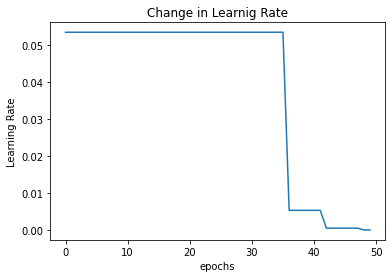

In [18]:
#Plotting LR
import matplotlib.pyplot as plt

lr_used = set(lr_list)
print(lr_used)

plt.plot(lr_list)
plt.title('Change in Learnig Rate')
plt.xlabel('epochs')
plt.ylabel('Learning Rate')

In [19]:
import torch
best_model = CusResNet18().to('cuda')
best_model.load_state_dict(torch.load('/content/classifier.pt'))
best_model.eval()
print('Done')

Done


In [0]:
import pynoob.plotting.plot as plot
import pynoob.plotting.graphs as graphs

Directory  /content/mis_class/ and /content/mis_class/images  already exists

Test set: Average loss: -19.9507, Accuracy: 9253/10000 (92.53%)

torch.Size([747, 3, 32, 32])


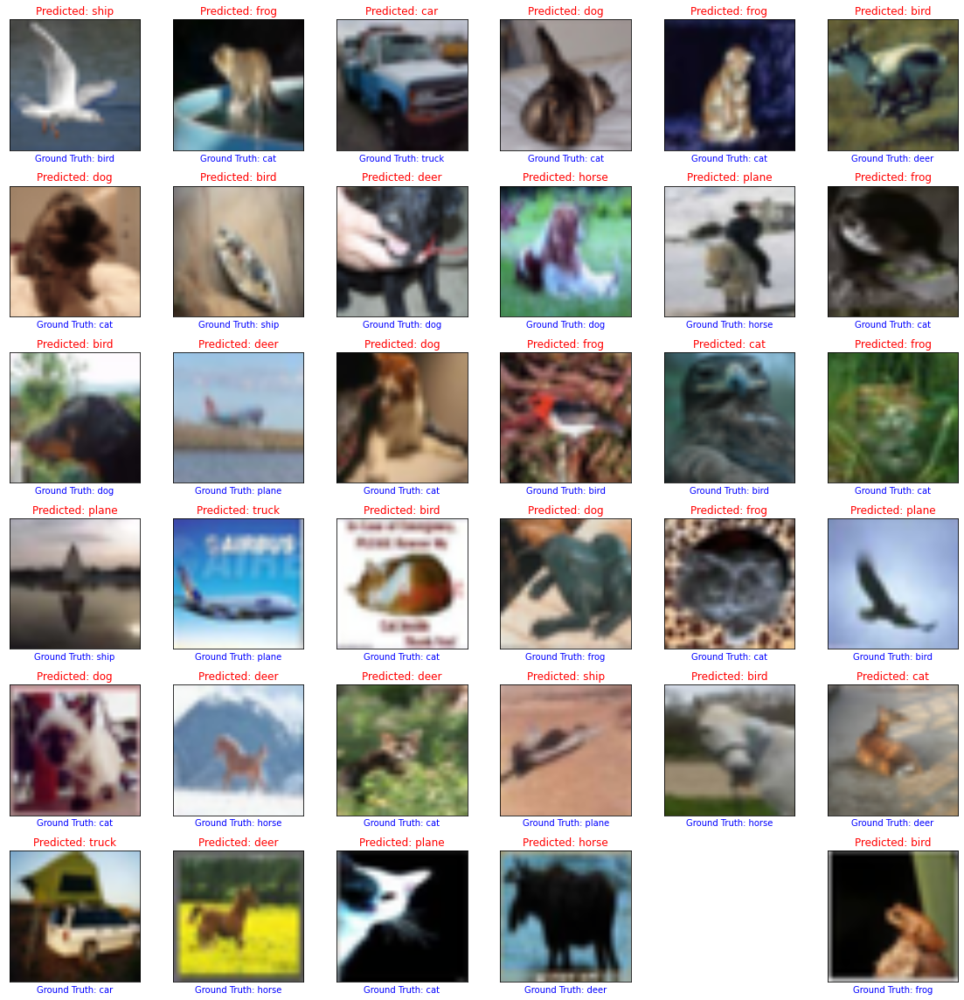

In [21]:
plot.mis(best_model, device, test_loader, 36)

In [22]:
len(plot.pred_list)

36

In [0]:
classes = plot.classes
pred_list = plot.pred_list
true_list = plot.true_list

In [24]:
layers = ['layer1', 'layer2', 'layer3', 'layer4']
for layer in layers:
  plot.gen_cam(best_model, layer, hm_lay=0.4, img_lay= 0.6) #Class idx defaulted to Predicted
  plot.gen_cam(best_model, layer, class_idx = true_list, hm_lay=0.4, img_lay= 0.6) #Setting Class idx to Actual Class

Directory  /content/result_pred/  already exists
Directory  /content/heatmap_pred/  already exists
Directory  /content/result_act/  already exists
Directory  /content/heatmap_act/  already exists
Directory  /content/result_pred/  already exists
Directory  /content/heatmap_pred/  already exists
Directory  /content/result_act/  already exists
Directory  /content/heatmap_act/  already exists
Directory  /content/result_pred/  already exists
Directory  /content/heatmap_pred/  already exists
Directory  /content/result_act/  already exists
Directory  /content/heatmap_act/  already exists
Directory  /content/result_pred/  already exists
Directory  /content/heatmap_pred/  already exists
Directory  /content/result_act/  already exists
Directory  /content/heatmap_act/  already exists


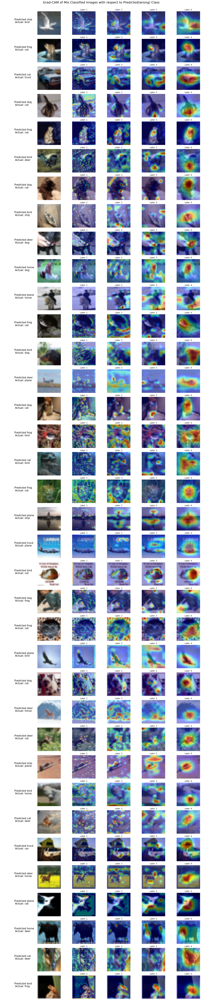

In [25]:
plot.plot_pred_cam(36, 4)

In [26]:
layers = ['layer1', 'layer2', 'layer3', 'layer4']
for layer in layers:
  plot.gen_cam(best_model, layer, class_idx = true_list)


Directory  /content/result_act/  already exists
Directory  /content/heatmap_act/  already exists
Directory  /content/result_act/  already exists
Directory  /content/heatmap_act/  already exists
Directory  /content/result_act/  already exists
Directory  /content/heatmap_act/  already exists
Directory  /content/result_act/  already exists
Directory  /content/heatmap_act/  already exists


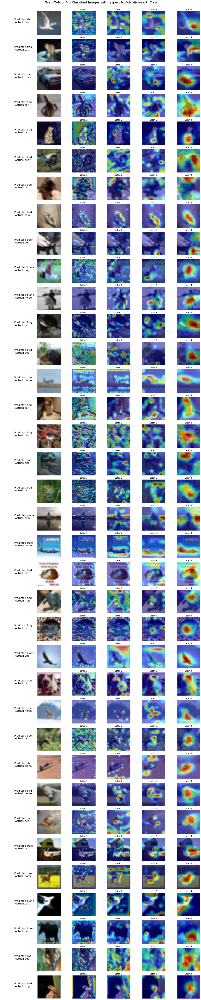

In [27]:
plot.plot_act_cam(36,4)

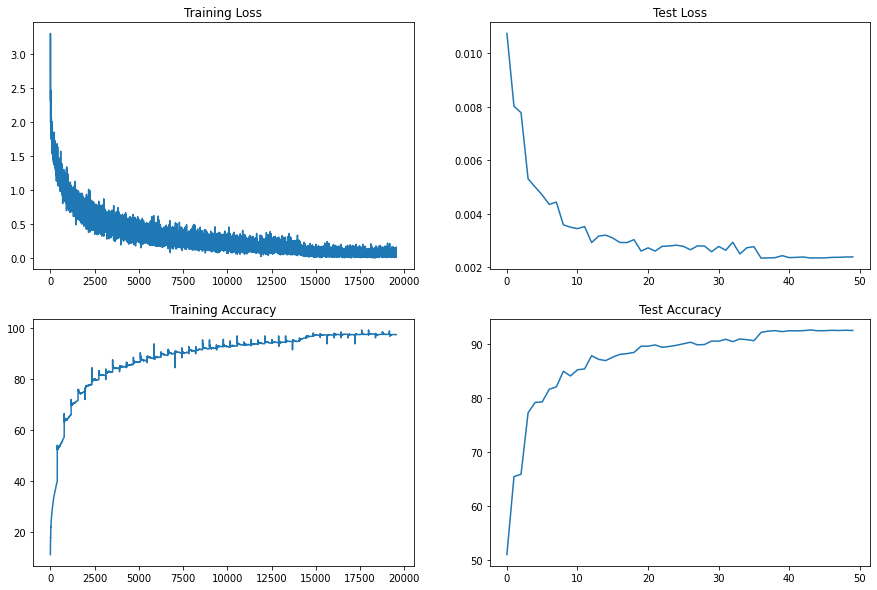

In [28]:
graphs.acc_loss(train, test)

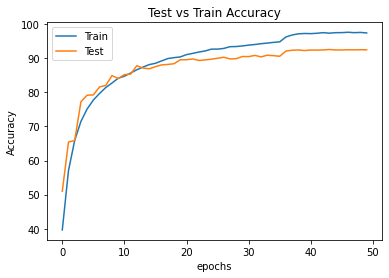

In [29]:
graphs.testvtrain(train, test)

In [30]:
graphs.class_acc(model, device, test_loader)

Accuracy of plane : 92 %
Accuracy of   car : 95 %
Accuracy of  bird : 89 %
Accuracy of   cat : 85 %
Accuracy of  deer : 93 %
Accuracy of   dog : 86 %
Accuracy of  frog : 95 %
Accuracy of horse : 94 %
Accuracy of  ship : 96 %
Accuracy of truck : 95 %


In [0]:
from pynoob.training.train import Train
from pynoob.training.test import Test
from torch.optim.lr_scheduler import ReduceLROnPlateau

model2 = CusResNet18().to(device)
optimizer2 = optim.SGD(model2.parameters(), lr= best_lr, momentum= 0.9)
criterion = nn.CrossEntropyLoss()
train2 = Train(model2, device, train_loader, optimizer2, criterion)
test2 = Test(model2, device, test_loader, criterion)
test_loss = test.test_loss
scheduler2 = ReduceLROnPlateau(optimizer2, mode='min', patience=3, verbose= True)

In [32]:
lr_list2 = []
epochs = 50
print('='*20 + 'START' + '='*20)
for epoch in range(epochs):
  print('='*20 + f' EPOCH: {epoch+1} ' + '='*20)
  train2.train(epoch)
  lr_list2.append(optimizer2.param_groups[0]['lr'])
  test2.test()
  scheduler2.step(test2.test_loss[-1]) #Have to give the val_loss or val_accuracy here. 
                                    #The metric on which we check reduction/increase 
                                    #and adjust learing rate

  0%|          | 0/391 [00:00<?, ?it/s]

====================START====================
==================== EPOCH: 1 ====================


Loss=1.279708743095398 Batch_id=390 Accuracy=39.03: 100%|██████████| 391/391 [00:32<00:00, 11.98it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0108, Accuracy: 5041/10000 (50.41%)

==================== EPOCH: 2 ====================


Loss=1.1278239488601685 Batch_id=390 Accuracy=55.88: 100%|██████████| 391/391 [00:32<00:00, 11.99it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0083, Accuracy: 6289/10000 (62.89%)

==================== EPOCH: 3 ====================


Loss=0.8769265413284302 Batch_id=390 Accuracy=65.26: 100%|██████████| 391/391 [00:32<00:00, 11.97it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0078, Accuracy: 6717/10000 (67.17%)

==================== EPOCH: 4 ====================


Loss=0.5726267099380493 Batch_id=390 Accuracy=70.73: 100%|██████████| 391/391 [00:32<00:00, 11.97it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0058, Accuracy: 7440/10000 (74.40%)

==================== EPOCH: 5 ====================


Loss=0.7553368806838989 Batch_id=390 Accuracy=74.39: 100%|██████████| 391/391 [00:32<00:00, 11.97it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0054, Accuracy: 7679/10000 (76.79%)

==================== EPOCH: 6 ====================


Loss=0.6109193563461304 Batch_id=390 Accuracy=76.94: 100%|██████████| 391/391 [00:32<00:00, 11.97it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0049, Accuracy: 7880/10000 (78.80%)

==================== EPOCH: 7 ====================


Loss=0.6203771829605103 Batch_id=390 Accuracy=79.12: 100%|██████████| 391/391 [00:32<00:00, 11.98it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0043, Accuracy: 8138/10000 (81.38%)

==================== EPOCH: 8 ====================


Loss=0.533190906047821 Batch_id=390 Accuracy=80.77: 100%|██████████| 391/391 [00:32<00:00, 11.96it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0042, Accuracy: 8249/10000 (82.49%)

==================== EPOCH: 9 ====================


Loss=0.7476745247840881 Batch_id=390 Accuracy=81.97: 100%|██████████| 391/391 [00:32<00:00, 11.95it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0036, Accuracy: 8478/10000 (84.78%)

==================== EPOCH: 10 ====================


Loss=0.35844844579696655 Batch_id=390 Accuracy=82.98: 100%|██████████| 391/391 [00:32<00:00, 11.95it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0039, Accuracy: 8369/10000 (83.69%)

==================== EPOCH: 11 ====================


Loss=0.5411177277565002 Batch_id=390 Accuracy=84.43: 100%|██████████| 391/391 [00:32<00:00, 11.96it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0040, Accuracy: 8383/10000 (83.83%)

==================== EPOCH: 12 ====================


Loss=0.27889925241470337 Batch_id=390 Accuracy=85.52: 100%|██████████| 391/391 [00:32<00:00, 11.96it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0032, Accuracy: 8581/10000 (85.81%)

==================== EPOCH: 13 ====================


Loss=0.4030960500240326 Batch_id=390 Accuracy=86.06: 100%|██████████| 391/391 [00:32<00:00, 11.95it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0031, Accuracy: 8697/10000 (86.97%)

==================== EPOCH: 14 ====================


Loss=0.23492924869060516 Batch_id=390 Accuracy=86.86: 100%|██████████| 391/391 [00:32<00:00, 11.96it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0034, Accuracy: 8592/10000 (85.92%)

==================== EPOCH: 15 ====================


Loss=0.3735089898109436 Batch_id=390 Accuracy=87.59: 100%|██████████| 391/391 [00:32<00:00, 11.94it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0031, Accuracy: 8735/10000 (87.35%)

==================== EPOCH: 16 ====================


Loss=0.18798519670963287 Batch_id=390 Accuracy=88.08: 100%|██████████| 391/391 [00:32<00:00, 11.95it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0032, Accuracy: 8740/10000 (87.40%)

==================== EPOCH: 17 ====================


Loss=0.2647911012172699 Batch_id=390 Accuracy=88.68: 100%|██████████| 391/391 [00:32<00:00, 11.98it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0029, Accuracy: 8799/10000 (87.99%)

==================== EPOCH: 18 ====================


Loss=0.18077914416790009 Batch_id=390 Accuracy=89.35: 100%|██████████| 391/391 [00:32<00:00, 11.96it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0031, Accuracy: 8782/10000 (87.82%)

==================== EPOCH: 19 ====================


Loss=0.25547847151756287 Batch_id=390 Accuracy=89.72: 100%|██████████| 391/391 [00:32<00:00, 11.95it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0028, Accuracy: 8843/10000 (88.43%)

==================== EPOCH: 20 ====================


Loss=0.2219669371843338 Batch_id=390 Accuracy=90.08: 100%|██████████| 391/391 [00:32<00:00, 11.95it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0028, Accuracy: 8844/10000 (88.44%)

==================== EPOCH: 21 ====================


Loss=0.4545615613460541 Batch_id=390 Accuracy=90.56: 100%|██████████| 391/391 [00:32<00:00, 11.95it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0030, Accuracy: 8775/10000 (87.75%)

==================== EPOCH: 22 ====================


Loss=0.37359267473220825 Batch_id=390 Accuracy=91.01: 100%|██████████| 391/391 [00:32<00:00, 11.96it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0029, Accuracy: 8892/10000 (88.92%)

==================== EPOCH: 23 ====================


Loss=0.20915834605693817 Batch_id=390 Accuracy=91.50: 100%|██████████| 391/391 [00:32<00:00, 11.96it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0027, Accuracy: 8933/10000 (89.33%)

==================== EPOCH: 24 ====================


Loss=0.19987617433071136 Batch_id=390 Accuracy=91.74: 100%|██████████| 391/391 [00:32<00:00, 11.96it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0027, Accuracy: 8914/10000 (89.14%)

==================== EPOCH: 25 ====================


Loss=0.2859562933444977 Batch_id=390 Accuracy=92.22: 100%|██████████| 391/391 [00:32<00:00, 11.96it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0028, Accuracy: 8949/10000 (89.49%)

==================== EPOCH: 26 ====================


Loss=0.2135203629732132 Batch_id=390 Accuracy=92.42: 100%|██████████| 391/391 [00:32<00:00, 11.94it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0028, Accuracy: 8959/10000 (89.59%)

==================== EPOCH: 27 ====================


Loss=0.17836326360702515 Batch_id=390 Accuracy=92.59: 100%|██████████| 391/391 [00:32<00:00, 11.95it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0030, Accuracy: 8910/10000 (89.10%)

Epoch    27: reducing learning rate of group 0 to 5.3367e-03.
==================== EPOCH: 28 ====================


Loss=0.15835091471672058 Batch_id=390 Accuracy=94.76: 100%|██████████| 391/391 [00:32<00:00, 11.96it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0024, Accuracy: 9152/10000 (91.52%)

==================== EPOCH: 29 ====================


Loss=0.14698636531829834 Batch_id=390 Accuracy=95.38: 100%|██████████| 391/391 [00:32<00:00, 11.94it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0023, Accuracy: 9172/10000 (91.72%)

==================== EPOCH: 30 ====================


Loss=0.040626708418130875 Batch_id=390 Accuracy=95.67: 100%|██████████| 391/391 [00:32<00:00, 11.95it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0024, Accuracy: 9157/10000 (91.57%)

==================== EPOCH: 31 ====================


Loss=0.14492592215538025 Batch_id=390 Accuracy=96.03: 100%|██████████| 391/391 [00:32<00:00, 11.96it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0025, Accuracy: 9186/10000 (91.86%)

==================== EPOCH: 32 ====================


Loss=0.06358666718006134 Batch_id=390 Accuracy=96.08: 100%|██████████| 391/391 [00:32<00:00, 11.95it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0024, Accuracy: 9196/10000 (91.96%)

==================== EPOCH: 33 ====================


Loss=0.07218003273010254 Batch_id=390 Accuracy=96.24: 100%|██████████| 391/391 [00:32<00:00, 11.95it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0024, Accuracy: 9210/10000 (92.10%)

Epoch    33: reducing learning rate of group 0 to 5.3367e-04.
==================== EPOCH: 34 ====================


Loss=0.07120974361896515 Batch_id=390 Accuracy=96.50: 100%|██████████| 391/391 [00:32<00:00, 11.94it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0024, Accuracy: 9210/10000 (92.10%)

==================== EPOCH: 35 ====================


Loss=0.017496353015303612 Batch_id=390 Accuracy=96.48: 100%|██████████| 391/391 [00:32<00:00, 11.96it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0025, Accuracy: 9212/10000 (92.12%)

==================== EPOCH: 36 ====================


Loss=0.11136945337057114 Batch_id=390 Accuracy=96.41: 100%|██████████| 391/391 [00:32<00:00, 11.94it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0024, Accuracy: 9214/10000 (92.14%)

==================== EPOCH: 37 ====================


Loss=0.33626627922058105 Batch_id=390 Accuracy=96.54: 100%|██████████| 391/391 [00:32<00:00, 11.94it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0024, Accuracy: 9221/10000 (92.21%)

Epoch    37: reducing learning rate of group 0 to 5.3367e-05.
==================== EPOCH: 38 ====================


Loss=0.1653253138065338 Batch_id=390 Accuracy=96.52: 100%|██████████| 391/391 [00:32<00:00, 11.96it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0024, Accuracy: 9218/10000 (92.18%)

==================== EPOCH: 39 ====================


Loss=0.19540061056613922 Batch_id=390 Accuracy=96.50: 100%|██████████| 391/391 [00:32<00:00, 11.95it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0025, Accuracy: 9215/10000 (92.15%)

==================== EPOCH: 40 ====================


Loss=0.10967929661273956 Batch_id=390 Accuracy=96.49: 100%|██████████| 391/391 [00:32<00:00, 11.95it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0025, Accuracy: 9220/10000 (92.20%)

==================== EPOCH: 41 ====================


Loss=0.11280550807714462 Batch_id=390 Accuracy=96.40: 100%|██████████| 391/391 [00:32<00:00, 11.96it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0024, Accuracy: 9226/10000 (92.26%)

Epoch    41: reducing learning rate of group 0 to 5.3367e-06.
==================== EPOCH: 42 ====================


Loss=0.07116793096065521 Batch_id=390 Accuracy=96.43: 100%|██████████| 391/391 [00:32<00:00, 11.96it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0024, Accuracy: 9215/10000 (92.15%)

==================== EPOCH: 43 ====================


Loss=0.16452130675315857 Batch_id=390 Accuracy=96.35: 100%|██████████| 391/391 [00:32<00:00, 11.94it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0024, Accuracy: 9217/10000 (92.17%)

==================== EPOCH: 44 ====================


Loss=0.08334576338529587 Batch_id=390 Accuracy=96.46: 100%|██████████| 391/391 [00:32<00:00, 11.96it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0024, Accuracy: 9206/10000 (92.06%)

==================== EPOCH: 45 ====================


Loss=0.06159733608365059 Batch_id=390 Accuracy=96.42: 100%|██████████| 391/391 [00:32<00:00, 11.93it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0024, Accuracy: 9216/10000 (92.16%)

Epoch    45: reducing learning rate of group 0 to 5.3367e-07.
==================== EPOCH: 46 ====================


Loss=0.14086754620075226 Batch_id=390 Accuracy=96.40: 100%|██████████| 391/391 [00:32<00:00, 11.93it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0024, Accuracy: 9212/10000 (92.12%)

==================== EPOCH: 47 ====================


Loss=0.03545800596475601 Batch_id=390 Accuracy=96.44: 100%|██████████| 391/391 [00:32<00:00, 11.95it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0025, Accuracy: 9219/10000 (92.19%)

==================== EPOCH: 48 ====================


Loss=0.1433056741952896 Batch_id=390 Accuracy=96.60: 100%|██████████| 391/391 [00:32<00:00, 11.95it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0024, Accuracy: 9222/10000 (92.22%)

==================== EPOCH: 49 ====================


Loss=0.06970364600419998 Batch_id=390 Accuracy=96.47: 100%|██████████| 391/391 [00:32<00:00, 11.95it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0024, Accuracy: 9219/10000 (92.19%)

Epoch    49: reducing learning rate of group 0 to 5.3367e-08.
==================== EPOCH: 50 ====================


Loss=0.1241394430398941 Batch_id=390 Accuracy=96.43: 100%|██████████| 391/391 [00:32<00:00, 11.93it/s]



Test set: Average loss: 0.0024, Accuracy: 9217/10000 (92.17%)



{0.053366992312063086, 5.33669923120631e-08, 0.005336699231206309, 5.33669923120631e-07, 0.0005336699231206309, 5.33669923120631e-06, 5.336699231206309e-05}


Text(0, 0.5, 'Learning Rate')

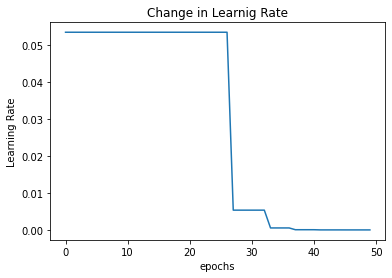

In [33]:
#Plotting LR
import matplotlib.pyplot as plt

lr_used2 = set(lr_list2)
print(lr_used2)

plt.plot(lr_list2)
plt.title('Change in Learnig Rate')
plt.xlabel('epochs')
plt.ylabel('Learning Rate')